# Telecom Churn Case Study
Business Problem Statement:
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition

The solution is divided into the following sections: 
- Data understanding and exploration
- Data cleaning
- Data preparation
- Model building and evaluation

### 1. Data Understanding and Exploration

Let's first have a look at the dataset and understand the size, attribute names etc.

In [551]:
#importing basic needed libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# hide warnings
import warnings
warnings.filterwarnings('ignore')

#%matplotlib notebook
%matplotlib inline

In [552]:
# reading the dataset
telecom = pd.read_csv("telecom_churn_data.csv")

In [553]:
# display all rows and columns with scroll
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [554]:
# summary of the dataset:
telecom.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [555]:
telecom.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   mobile_number             int64  
 1   circle_id                 int64  
 2   loc_og_t2o_mou            float64
 3   std_og_t2o_mou            float64
 4   loc_ic_t2o_mou            float64
 5   last_date_of_month_6      object 
 6   last_date_of_month_7      object 
 7   last_date_of_month_8      object 
 8   last_date_of_month_9      object 
 9   arpu_6                    float64
 10  arpu_7                    float64
 11  arpu_8                    float64
 12  arpu_9                    float64
 13  onnet_mou_6               float64
 14  onnet_mou_7               float64
 15  onnet_mou_8               float64
 16  onnet_mou_9               float64
 17  offnet_mou_6              float64
 18  offnet_mou_7              float64
 19  offnet_mou_8              float64
 20  offnet_mou_9              f

In [556]:
telecom.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [557]:
#check the data
telecom.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [558]:
#check the shape
telecom.shape

(99999, 226)

In [559]:
#Derive the target variable churn based on usage
#if the customer didn't used any incoming calls, outgoing calls and data in the 9th month then the customer is churned
telecom['churn'] = ((telecom['total_ic_mou_9']==0.0) & (telecom['total_og_mou_9']==0.0) & (telecom['vol_2g_mb_9']==0.0) & (telecom['vol_3g_mb_9']==0.0)).astype(int)

In [560]:
telecom['churn'].value_counts()

0    89808
1    10191
Name: churn, dtype: int64

<AxesSubplot:ylabel='churn'>

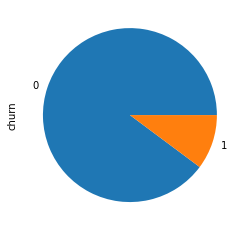

In [561]:
(telecom['churn'].value_counts(1)*100).plot(kind='pie')

In [562]:
#dropping all 9th month related features since we have already derived churn based on them
telecom = telecom.drop(['last_date_of_month_9', 'arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 
                        'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 
                        'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9',
                        'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 
                        'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 
                        'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_t2o_mou_9',
                        'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 
                        'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'date_of_last_rech_9', 
                        'last_day_rch_amt_9', 'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9', 
                        'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 
                        'arpu_3g_9', 'arpu_2g_9', 'night_pck_user_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 
                        'sachet_3g_9', 'fb_user_9', 'sep_vbc_3g'], axis = 1)

In [563]:
telecom.head(10)

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,4.13,NaN,NaN,1.15,NaN,NaN,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,0.00,0.00,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,4,3,2,362,252,252,252,252,252,6/21/2014,7/16/2014,8/8/2014,252,252,252,6/21/2014,7/16/2014,8/8/2014,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.40,0.00,101.20,1
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,34.047,355.074,268.321,24.11,78.68,7.68,15.74,99.84,304.76,0.00,0.00,0.00,0.00,0.00,0.00,23.88,74.56,7.68,11.51,75.94,291.86,0.00,0.00,0.00,0.00,2.91,0.00,35.39,150.51,299.54,0.23,4.11,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.0,0.0,0.0,0.23,4.58,0.13,0.0,0.00,0.00,4.68,23.43,12.76,0.00,0.0,0.0,40.31,178.53,312.44,1.61,29.91,29.23,17.48,65.38,375.58,0.00,8.93,3.61,19.09,104.23,408.43,0.00,0.00,2.35,5.90,0.00,12.49,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,26.83,104.23,423.28,0.00,0.00,0.00,1.83,0.00,0.00,0.00,0.00,0.00,4,9,11,74,384,283,44,154,65,6/29/2014,7/31/2014,8/28/2014,4

In [564]:
telecom.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 172 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   mobile_number             int64  
 1   circle_id                 int64  
 2   loc_og_t2o_mou            float64
 3   std_og_t2o_mou            float64
 4   loc_ic_t2o_mou            float64
 5   last_date_of_month_6      object 
 6   last_date_of_month_7      object 
 7   last_date_of_month_8      object 
 8   arpu_6                    float64
 9   arpu_7                    float64
 10  arpu_8                    float64
 11  onnet_mou_6               float64
 12  onnet_mou_7               float64
 13  onnet_mou_8               float64
 14  offnet_mou_6              float64
 15  offnet_mou_7              float64
 16  offnet_mou_8              float64
 17  roam_ic_mou_6             float64
 18  roam_ic_mou_7             float64
 19  roam_ic_mou_8             float64
 20  roam_og_mou_6             f

In [565]:
#check the describe
telecom.describe(include="all")

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999,99398,98899,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.0,96140.0,94621.0,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.0,96140.0,94621.0,96062.000000,96140.000000,94621.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,96062.000000,96140.000000,94621.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,98392,98232,96377,99999.000000,99999.000000,

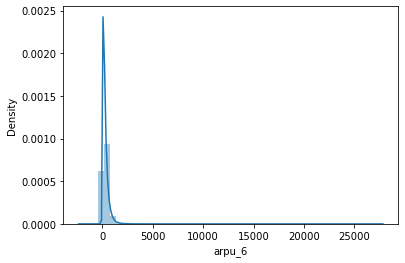

In [566]:
sns.distplot(telecom['arpu_6'])
plt.show()

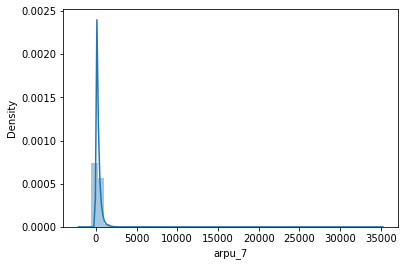

In [567]:
sns.distplot(telecom['arpu_7'])
plt.show()

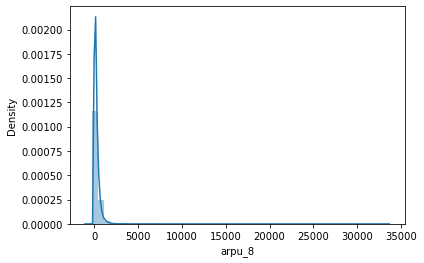

In [568]:
sns.distplot(telecom['arpu_8'])
plt.show()

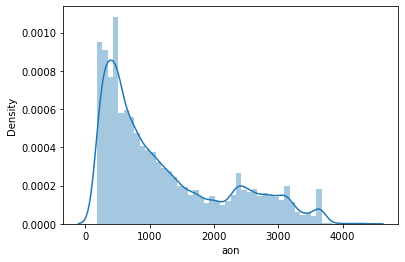

In [569]:
sns.distplot(telecom['aon'])
plt.show()

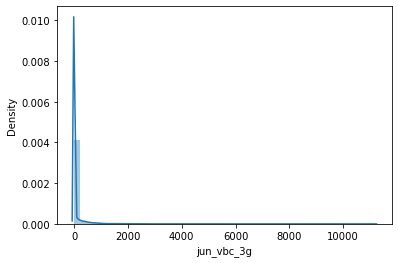

In [570]:
sns.distplot(telecom['jun_vbc_3g'])
plt.show()

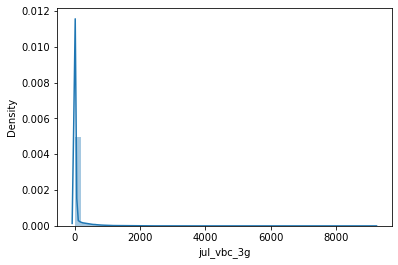

In [571]:
sns.distplot(telecom['jul_vbc_3g'])
plt.show()

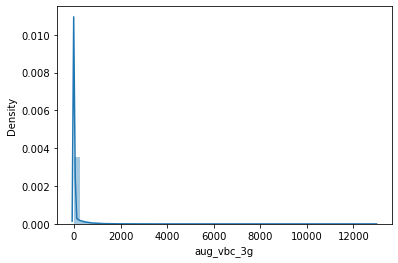

In [572]:
sns.distplot(telecom['aug_vbc_3g'])
plt.show()

We'll first subset the list of all (independent) numeric variables, and then make a **pairwise plot**.

In [573]:
# all numeric (float and int) variables in the dataset
telecom_numeric = telecom.select_dtypes(include=['float64', 'int64'])
telecom_numeric.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
0,7000842753,109,0.0,0.0,0.0,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,4.13,NaN,NaN,1.15,NaN,NaN,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,0.00,0.00,5.44,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,4,3,2,362,252,252,252,252,252,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.4,0.0,101.20,1
1,7001865778,109,0.0,0.0,0.0,34.047,355.074,268.321,24.11,78.68,7.68,15.74,99.84,304.76,0.0,0.00,0.00,0.0,0.00,0.00,23.88,74.56,7.68,11.51,75.94,291.86,0.00,0.00,0.00,0.0,2.91,0.00,35.39,150.51,299.54,0.23,4.11,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.0,0.0,0.0,0.23,4.58,0.13,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.0,0.0,40.31,178.53,312.44,1.61,29.91,29.23,17.48,65.38,375.58,0.00,8.93,3.61,19.09,104.23,408.43,0.00,0.00,2.35,5.90,0.00,12.49,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,26.83,104.23,423.28,0.00,0.0,0.0,1.83,0.00,0.0,0.00,0.00,0.0,4,9,11,74,384,283,44,154,65,44,23,30,NaN,1.0,2.0,NaN,154.0,25.0,NaN,1.0,2.0,NaN,0.0,0.0,NaN,154.0,50.0,0.00,108.07,365.47,0.00,0.00,0.00,NaN,0.00,0.00,NaN,28.61,7.60,NaN,0.0,0.0,0,1,0,0,0,2,0,0,0,0,0,0,NaN,1.0,1.0,1006,0.0,0.0,0.00,0
2,7001625959,109,0.0,0.0,0.0,167.690,189.058,210.226,11.54,55.24,37.26,143.33,220.59,208.36,0.0,0.00,0.00,0.0,0.00,0.00,7.19,28.74,13.58,29.34,16.86,38.46,2

In [574]:
# dropping Id 
telecom_numeric = telecom_numeric.drop(['mobile_number', 'circle_id'], axis=1)
telecom_numeric.head()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
0,0.0,0.0,0.0,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,NaN,NaN,0.0,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,4.13,NaN,NaN,1.15,NaN,NaN,5.44,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.00,NaN,NaN,0.0,NaN,NaN,0.00,0.00,0.00,5.44,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,4,3,2,362,252,252,252,252,252,252,252,252,1.0,1.0,1.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0,0,0,0,0,0,1,1,1,0,0,0,1.0,1.0,1.0,968,30.4,0.0,101.20,1
1,0.0,0.0,0.0,34.047,355.074,268.321,24.11,78.68,7.68,15.74,99.84,304.76,0.0,0.00,0.00,0.0,0.00,0.00,23.88,74.56,7.68,11.51,75.94,291.86,0.00,0.00,0.00,0.0,2.91,0.00,35.39,150.51,299.54,0.23,4.11,0.00,0.00,0.46,0.13,0.00,0.00,0.00,0.0,0.0,0.0,0.23,4.58,0.13,0.0,0.0,0.0,4.68,23.43,12.76,0.00,0.0,0.0,40.31,178.53,312.44,1.61,29.91,29.23,17.48,65.38,375.58,0.00,8.93,3.61,19.09,104.23,408.43,0.00,0.00,2.35,5.90,0.00,12.49,0.00,0.00,0.00,0.0,0.0,0.0,5.90,0.00,14.84,26.83,104.23,423.28,0.00,0.0,0.0,1.83,0.00,0.0,0.00,0.00,0.0,4,9,11,74,384,283,44,154,65,44,23,30,NaN,1.0,2.0,NaN,154.0,25.0,NaN,1.0,2.0,NaN,0.0,0.0,NaN,154.0,50.0,0.00,108.07,365.47,0.00,0.00,0.00,NaN,0.00,0.00,NaN,28.61,7.60,NaN,0.0,0.0,0,1,0,0,0,2,0,0,0,0,0,0,NaN,1.0,1.0,1006,0.0,0.0,0.00,0
2,0.0,0.0,0.0,167.690,189.058,210.226,11.54,55.24,37.26,143.33,220.59,208.36,0.0,0.00,0.00,0.0,0.00,0.00,7.19,28.74,13.58,29.34,16.86,38.46,24.11,21.79,15.61,0.0,135.54,45.76,60.66,67.41,67.66,4.34,26.49,22.58,

This is quite hard to read, and we can rather plot correlations between variables. Also, a heatmap is pretty useful to visualise multiple correlations in one plot.

In [575]:
# correlation matrix
cor = telecom_numeric.corr()
cor

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn
loc_og_t2o_mou,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std_og_t2o_mou,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loc_ic_t2o_mou,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

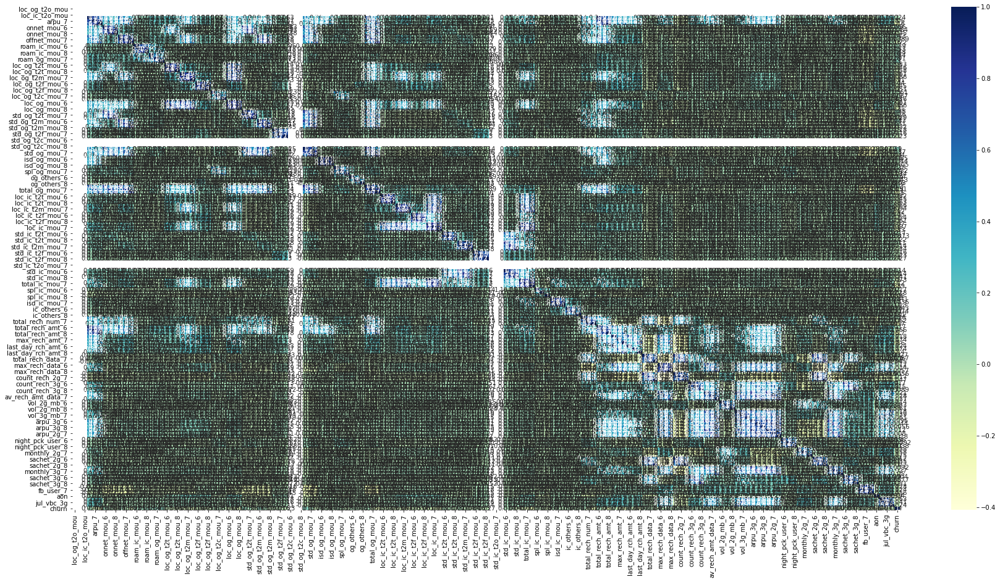

In [576]:
# plotting correlations on a heatmap

# figure size
plt.figure(figsize=(30,15))

# heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

#TODO
The heatmap shows some useful insights:

Correlation of SalePrice with independent variables:
- Price is highly (positively) correlated with OverallQual(0.79), GrLivArea(0.71), GarageCars(0.64), GarageArea(0.61), TotalBsmtSF, 1stFlrSF, FullBath, TotRmsAbvGrd, YearBuilt and YearRemodAdd

- Price is negatively correlated to KitchenAbvGr, EnclosedPorch, MsSubClass, OverallCond and Yrsold

Correlation among independent variables:
- Some of the independent variables are highly positively correlated like 
    a) GarageCars, GarageArea, GarageYrBlt
    b) TotalBsmtSF, 1stFlrSF
    

Thus, while building the model, we'll have to pay attention to multicollinearity (especially linear models, such as linear and logistic regression, suffer more from multicollinearity).

## 2. Data Cleaning

Let's now conduct some data cleaning steps. 

We've seen that there are missing values in the dataset. 

<AxesSubplot:>

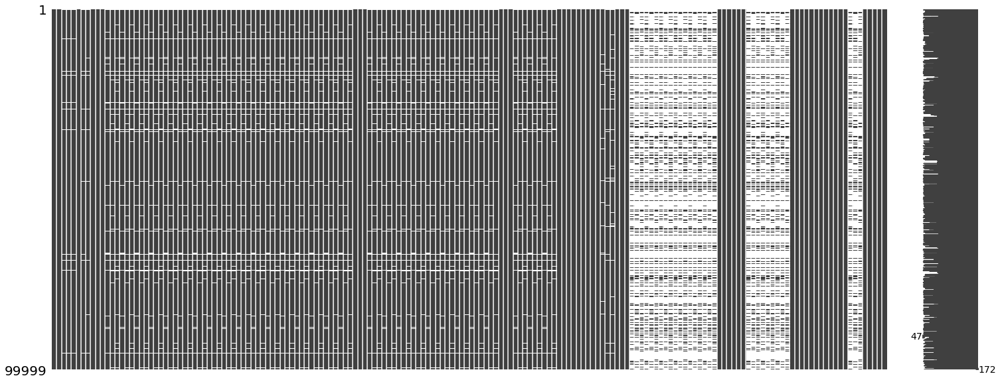

In [577]:
#!pip install missingno
import missingno as msno 


# Visualize missing values as a matrix 
msno.matrix(telecom) 

In [578]:
# finding the percentage of missing value
# summing up the missing values (column-wise) and displaying fraction of NaNs
round(100*(telecom.isnull().sum()/len(telecom)),2)

mobile_number                0.00
circle_id                    0.00
loc_og_t2o_mou               1.02
std_og_t2o_mou               1.02
loc_ic_t2o_mou               1.02
last_date_of_month_6         0.00
last_date_of_month_7         0.60
last_date_of_month_8         1.10
arpu_6                       0.00
arpu_7                       0.00
arpu_8                       0.00
onnet_mou_6                  3.94
onnet_mou_7                  3.86
onnet_mou_8                  5.38
offnet_mou_6                 3.94
offnet_mou_7                 3.86
offnet_mou_8                 5.38
roam_ic_mou_6                3.94
roam_ic_mou_7                3.86
roam_ic_mou_8                5.38
roam_og_mou_6                3.94
roam_og_mou_7                3.86
roam_og_mou_8                5.38
loc_og_t2t_mou_6             3.94
loc_og_t2t_mou_7             3.86
loc_og_t2t_mou_8             5.38
loc_og_t2m_mou_6             3.94
loc_og_t2m_mou_7             3.86
loc_og_t2m_mou_8             5.38
loc_og_t2f_mou

In [579]:
#removing columns with high missing values
#finding the list of columns with any missing value
missing_col_list = round(100*(telecom.isnull().sum()/len(telecom)), 2)
missing_col_list.loc[missing_col_list > 0]

loc_og_t2o_mou               1.02
std_og_t2o_mou               1.02
loc_ic_t2o_mou               1.02
last_date_of_month_7         0.60
last_date_of_month_8         1.10
onnet_mou_6                  3.94
onnet_mou_7                  3.86
onnet_mou_8                  5.38
offnet_mou_6                 3.94
offnet_mou_7                 3.86
offnet_mou_8                 5.38
roam_ic_mou_6                3.94
roam_ic_mou_7                3.86
roam_ic_mou_8                5.38
roam_og_mou_6                3.94
roam_og_mou_7                3.86
roam_og_mou_8                5.38
loc_og_t2t_mou_6             3.94
loc_og_t2t_mou_7             3.86
loc_og_t2t_mou_8             5.38
loc_og_t2m_mou_6             3.94
loc_og_t2m_mou_7             3.86
loc_og_t2m_mou_8             5.38
loc_og_t2f_mou_6             3.94
loc_og_t2f_mou_7             3.86
loc_og_t2f_mou_8             5.38
loc_og_t2c_mou_6             3.94
loc_og_t2c_mou_7             3.86
loc_og_t2c_mou_8             5.38
loc_og_mou_6  

In [580]:
telecom['loc_og_t2o_mou'].value_counts()

0.0    98981
Name: loc_og_t2o_mou, dtype: int64

In [581]:
telecom['std_og_t2o_mou'].value_counts()

0.0    98981
Name: std_og_t2o_mou, dtype: int64

In [582]:
telecom['loc_ic_t2o_mou'].value_counts()

0.0    98981
Name: loc_ic_t2o_mou, dtype: int64

In [583]:
#dropping above columns as they have only 0.0 as value
telecom = telecom.drop(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou'], axis=1)

In [584]:
missing_col_list = round(100*(telecom.isnull().sum()/len(telecom)), 2)
missing_col_list.loc[missing_col_list > 0]

last_date_of_month_7         0.60
last_date_of_month_8         1.10
onnet_mou_6                  3.94
onnet_mou_7                  3.86
onnet_mou_8                  5.38
offnet_mou_6                 3.94
offnet_mou_7                 3.86
offnet_mou_8                 5.38
roam_ic_mou_6                3.94
roam_ic_mou_7                3.86
roam_ic_mou_8                5.38
roam_og_mou_6                3.94
roam_og_mou_7                3.86
roam_og_mou_8                5.38
loc_og_t2t_mou_6             3.94
loc_og_t2t_mou_7             3.86
loc_og_t2t_mou_8             5.38
loc_og_t2m_mou_6             3.94
loc_og_t2m_mou_7             3.86
loc_og_t2m_mou_8             5.38
loc_og_t2f_mou_6             3.94
loc_og_t2f_mou_7             3.86
loc_og_t2f_mou_8             5.38
loc_og_t2c_mou_6             3.94
loc_og_t2c_mou_7             3.86
loc_og_t2c_mou_8             5.38
loc_og_mou_6                 3.94
loc_og_mou_7                 3.86
loc_og_mou_8                 5.38
std_og_t2t_mou

In [585]:
telecom['last_date_of_month_7'].unique()

array(['7/31/2014', nan], dtype=object)

In [586]:
telecom['last_date_of_month_7'] = telecom['last_date_of_month_7'].replace(np.nan, "7/31/2014")

In [587]:
telecom['last_date_of_month_7'].unique()

array(['7/31/2014'], dtype=object)

In [588]:
telecom['last_date_of_month_8'].unique()

array(['8/31/2014', nan], dtype=object)

In [589]:
telecom['last_date_of_month_8'] = telecom['last_date_of_month_8'].replace(np.nan, "8/31/2014")

In [590]:
telecom['last_date_of_month_8'].unique()

array(['8/31/2014'], dtype=object)

In [591]:
telecom['onnet_mou_6'].value_counts()

0.00       8928
0.33         80
0.26         76
0.48         75
0.31         72
0.28         68
2.01         66
0.36         65
1.01         63
0.43         63
0.83         62
0.35         61
0.98         61
0.91         60
0.01         58
0.45         57
0.18         57
0.86         56
1.51         56
0.25         55
0.78         55
0.38         54
0.46         54
0.20         54
0.53         54
0.76         53
0.50         53
1.63         52
0.55         52
1.33         52
0.63         52
0.21         51
0.41         51
1.11         51
1.18         51
0.61         51
0.96         51
0.23         51
1.06         50
1.13         50
0.66         50
0.58         50
1.61         50
1.08         50
1.66         50
0.16         50
0.68         50
0.88         50
1.41         50
0.73         49
1.03         49
0.30         49
0.15         49
0.71         47
0.03         47
3.66         46
0.51         46
0.56         46
0.65         45
1.78         45
2.63         45
1.53         45
1.21    

In [592]:
print(telecom['onnet_mou_6'].isnull().sum())
telecom['onnet_mou_6'] = telecom['onnet_mou_6'].replace(np.nan, 0.00)
print(telecom['onnet_mou_6'].isnull().sum())

3937
0


In [593]:
telecom['onnet_mou_7'].isnull().sum()

3859

In [594]:
telecom['onnet_mou_7'].value_counts()

0.00       9291
1.01         82
0.03         77
0.48         72
0.18         67
0.21         67
0.46         67
0.41         66
0.58         65
0.26         65
0.61         64
0.35         63
0.81         63
0.01         63
0.98         63
0.23         62
0.63         61
0.25         61
0.31         61
0.83         61
0.56         61
0.36         60
0.73         60
0.53         59
0.28         59
0.16         58
1.66         58
0.30         57
0.76         57
2.01         57
0.38         57
1.16         56
0.65         56
0.33         55
0.20         55
1.18         55
0.43         55
0.70         55
0.66         55
1.06         54
1.43         54
1.28         54
0.93         53
1.08         53
0.51         52
0.78         52
0.55         52
0.86         52
0.45         51
0.60         51
1.53         51
1.76         51
0.68         51
0.50         50
1.21         49
3.23         49
2.76         48
2.81         48
2.53         48
0.91         47
1.61         47
0.96         47
1.33    

In [595]:
telecom['onnet_mou_7'] = telecom['onnet_mou_7'].replace(np.nan, 0.00)

In [596]:
telecom['onnet_mou_7'].isnull().sum()

0

In [597]:
telecom['onnet_mou_8'].value_counts()

0.00        9419
0.38          87
1.01          83
0.41          77
0.36          74
0.48          74
0.28          71
0.88          70
0.01          70
0.76          68
0.66          67
0.25          66
0.55          66
0.18          66
0.40          65
0.63          64
0.33          64
0.35          64
0.50          64
0.43          63
0.21          63
0.30          61
0.96          61
0.03          59
0.51          59
0.23          58
1.13          58
0.26          58
0.31          58
0.45          58
0.46          57
0.73          57
0.61          55
0.56          55
0.93          53
0.91          52
0.81          52
0.83          52
1.03          52
0.58          52
0.16          51
2.01          51
0.60          51
1.06          50
0.65          50
1.98          50
1.33          49
1.48          49
2.06          49
1.11          48
0.85          48
0.68          48
2.23          47
1.51          47
0.98          47
0.71          47
0.53          47
2.38          46
1.56          

In [598]:
print(telecom['onnet_mou_8'].isnull().sum())
telecom['onnet_mou_8'] = telecom['onnet_mou_8'].replace(np.nan, 0.00)
print(telecom['onnet_mou_8'].isnull().sum())

5378
0


In [599]:
telecom['offnet_mou_6'].value_counts()

0.00       3715
1.01         42
0.01         41
0.58         35
0.03         31
0.43         30
0.05         29
0.61         29
0.63         28
0.53         28
0.48         28
0.86         27
0.56         27
0.36         26
0.68         26
0.25         26
0.08         26
0.66         25
0.31         25
0.33         25
0.73         25
41.38        24
0.20         24
0.23         24
0.38         24
0.16         24
0.15         24
0.81         23
1.18         23
1.26         23
2.46         22
2.01         22
0.21         22
0.35         22
0.10         22
1.56         22
3.01         22
21.84        22
0.26         22
1.36         21
4.73         21
0.13         21
0.90         21
0.60         21
0.11         21
1.13         21
3.56         20
0.98         20
7.26         20
0.71         20
2.48         20
5.26         20
0.28         20
1.68         20
1.08         20
0.41         20
1.06         20
0.80         19
2.71         19
0.46         19
1.10         19
0.96         19
1.03    

In [600]:
print(telecom['offnet_mou_6'].isnull().sum())
telecom['offnet_mou_6'] = telecom['offnet_mou_6'].replace(np.nan, 0.00)
print(telecom['offnet_mou_6'].isnull().sum())

3937
0


In [601]:
telecom['offnet_mou_7'].value_counts()

0.00       3840
0.03         38
0.35         35
1.01         33
0.36         33
0.33         32
0.13         31
0.78         31
0.28         31
0.16         30
1.46         29
0.53         29
0.11         29
0.20         29
0.73         29
0.26         29
0.55         28
0.43         28
0.41         27
0.83         27
0.98         26
0.23         26
0.40         26
2.18         26
0.93         26
2.01         26
0.06         26
0.30         26
0.10         25
2.13         25
0.38         25
0.48         25
0.63         25
0.51         24
0.58         24
1.11         24
0.31         24
0.01         24
0.81         24
1.06         24
0.88         23
0.18         23
0.21         23
0.05         23
1.08         22
2.44         22
7.73         22
1.86         22
0.15         22
0.56         22
1.13         22
0.50         22
1.98         22
0.61         21
1.16         21
2.48         21
1.03         21
1.66         21
3.61         21
3.01         21
0.68         21
1.73         20
2.96    

In [602]:
print(telecom['offnet_mou_7'].isnull().sum())
telecom['offnet_mou_7'] = telecom['offnet_mou_7'].replace(np.nan, 0.00)
print(telecom['offnet_mou_7'].isnull().sum())

3859
0


In [603]:
telecom['offnet_mou_8'].value_counts()

0.00        4176
0.03          40
0.41          39
1.01          37
0.18          35
0.01          34
0.21          31
1.08          30
0.31          29
1.81          29
0.10          29
0.28          28
0.16          28
0.53          28
0.40          28
0.13          28
0.66          28
0.23          27
0.93          27
0.36          27
0.56          27
0.35          27
0.15          26
0.48          26
0.70          26
0.46          25
0.06          25
0.26          25
1.16          25
0.68          24
0.33          24
1.93          24
0.96          24
0.20          23
25.39         23
1.21          23
1.23          23
0.71          23
1.68          23
0.11          23
0.78          23
1.31          22
1.38          22
0.83          22
1.03          22
0.05          22
1.11          22
0.45          22
0.25          22
0.43          21
0.38          21
7.63          21
2.31          21
0.95          21
1.41          21
0.76          21
0.61          21
2.48          21
0.08          

In [604]:
print(telecom['offnet_mou_8'].isnull().sum())
telecom['offnet_mou_8'] = telecom['offnet_mou_8'].replace(np.nan, 0.00)
print(telecom['offnet_mou_8'].isnull().sum())

5378
0


In [605]:
telecom['roam_ic_mou_6'].value_counts()

0.00        76747
1.01           78
0.71           47
0.30           43
0.15           38
0.93           38
0.35           38
2.01           37
0.03           37
0.31           37
0.61           37
0.86           37
0.46           37
1.03           37
0.63           36
0.05           36
0.65           35
0.48           35
0.36           34
0.33           34
0.21           34
0.96           34
1.18           34
0.23           34
0.88           34
0.76           34
0.60           34
0.20           33
0.28           33
0.41           33
0.70           33
0.81           33
0.45           33
1.26           32
0.06           31
0.78           31
0.98           31
0.53           31
0.58           31
1.23           31
0.51           31
0.68           30
0.55           30
0.91           30
1.88           30
0.80           30
1.30           30
1.11           29
1.33           29
1.13           29
0.38           29
0.13           29
0.43           29
1.36           29
0.26           28
0.73      

In [606]:
print(telecom['roam_ic_mou_6'].isnull().sum())
telecom['roam_ic_mou_6'] = telecom['roam_ic_mou_6'].replace(np.nan, 0.00)
print(telecom['roam_ic_mou_6'].isnull().sum())

3937
0


In [607]:
telecom['roam_ic_mou_7'].value_counts()

0.00        81294
1.01           79
0.20           44
0.03           38
0.51           38
0.05           37
1.28           35
0.38           34
0.43           34
0.33           33
0.21           32
0.26           32
0.56           32
0.58           31
0.48           31
0.60           30
0.06           30
0.46           30
0.45           29
0.18           29
0.53           29
0.88           28
2.01           28
0.35           28
0.50           27
1.58           27
0.30           27
0.93           26
0.01           26
1.48           26
1.03           26
0.36           25
0.83           25
1.26           25
0.61           25
1.80           25
0.66           25
0.98           25
1.78           25
0.65           24
1.63           24
0.55           24
2.03           24
0.86           24
0.08           24
0.76           23
1.41           23
1.36           23
1.88           23
0.68           23
1.76           23
0.40           22
1.08           22
1.20           22
2.98           22
1.53      

In [608]:
print(telecom['roam_ic_mou_7'].isnull().sum())
telecom['roam_ic_mou_7'] = telecom['roam_ic_mou_7'].replace(np.nan, 0.00)
print(telecom['roam_ic_mou_7'].isnull().sum())

3859
0


In [609]:
telecom['roam_ic_mou_8'].value_counts()

0.00        80169
1.01           64
0.25           38
0.28           36
0.68           34
0.30           34
1.18           33
0.88           33
0.53           32
0.66           31
0.46           31
0.31           31
1.11           30
0.61           29
2.28           29
0.26           29
0.63           28
1.16           27
0.55           27
0.50           27
0.48           27
0.71           27
0.56           27
1.66           26
1.08           26
1.21           26
1.13           26
1.23           26
0.75           26
0.96           25
1.53           25
0.33           25
0.38           25
0.73           25
0.36           25
0.21           25
0.03           24
0.35           24
1.91           24
0.51           24
0.81           24
0.93           24
1.26           24
0.43           23
0.91           23
0.98           23
0.40           23
1.41           23
0.80           23
1.51           23
1.20           23
0.78           23
0.41           22
0.60           22
1.38           22
1.31      

In [610]:
print(telecom['roam_ic_mou_8'].isnull().sum())
telecom['roam_ic_mou_8'] = telecom['roam_ic_mou_8'].replace(np.nan, 0.00)
print(telecom['roam_ic_mou_8'].isnull().sum())

5378
0


In [611]:
telecom['roam_og_mou_6'].value_counts()

0.00       76664
0.21          73
1.01          42
0.33          37
0.35          35
0.23          34
0.36          34
0.01          33
0.43          32
0.60          29
0.18          29
0.48          29
0.58          29
0.66          29
0.38          28
0.03          28
0.28          28
0.53          27
2.01          27
0.73          27
0.68          26
0.45          26
0.30          25
0.91          25
0.05          25
0.51          25
1.13          24
0.65          24
0.20          24
1.18          24
1.11          24
0.25          23
0.26          23
0.71          23
0.88          23
0.31          23
1.16          23
0.86          22
1.56          22
0.98          22
1.61          22
0.50          22
1.06          22
1.36          21
2.28          21
0.63          21
3.51          20
0.56          20
0.46          20
0.81          20
1.76          20
2.26          20
1.33          19
0.61          19
0.11          19
0.55          19
0.96          19
0.93          19
1.21          

In [612]:
print(telecom['roam_og_mou_6'].isnull().sum())
telecom['roam_og_mou_6'] = telecom['roam_og_mou_6'].replace(np.nan, 0.00)
print(telecom['roam_og_mou_6'].isnull().sum())

3937
0


In [613]:
telecom['roam_og_mou_7'].value_counts()

0.00       81344
1.01          37
0.43          30
0.21          26
0.68          26
0.01          26
0.91          26
0.30          25
0.38          23
0.26          23
0.48          23
0.46          23
1.11          22
1.13          22
1.26          22
0.83          22
2.01          22
0.71          22
0.36          21
0.93          21
0.45          21
0.81          20
0.35          20
0.88          20
0.11          19
0.03          19
0.63          19
1.20          19
0.33          19
0.58          19
0.53          19
0.28          19
0.61          19
1.53          18
0.51          18
0.10          18
0.23          18
2.76          18
0.78          18
0.13          18
0.25          18
0.66          18
0.55          18
0.18          18
0.86          18
1.03          17
0.65          17
0.76          17
0.40          17
0.06          17
1.73          17
3.23          17
0.16          17
0.05          17
0.41          16
0.15          16
5.01          16
0.73          16
0.56          

In [614]:
print(telecom['roam_og_mou_7'].isnull().sum())
telecom['roam_og_mou_7'] = telecom['roam_og_mou_7'].replace(np.nan, 0.00)
print(telecom['roam_og_mou_7'].isnull().sum())

3859
0


In [615]:
telecom['roam_og_mou_8'].value_counts()

0.00       80273
0.03          33
0.43          28
0.23          28
0.18          27
0.55          27
1.01          25
0.51          25
0.01          25
0.60          24
0.50          24
0.16          24
0.31          24
0.38          23
0.26          23
0.13          23
1.21          23
0.78          22
0.53          22
0.20          21
0.76          21
1.03          21
0.40          21
0.56          21
0.30          21
0.08          21
1.18          21
0.81          21
0.71          20
0.85          20
1.38          20
0.65          19
0.66          19
0.21          19
0.10          19
0.63          19
0.36          19
0.11          19
1.35          18
0.93          18
1.91          18
0.48          18
0.68          18
3.81          18
0.95          18
0.88          17
0.45          17
1.30          17
1.58          17
0.33          17
0.80          17
0.46          17
0.91          16
3.11          16
2.56          16
1.98          16
1.96          16
1.75          16
1.25          

In [616]:
print(telecom['roam_og_mou_8'].isnull().sum())
telecom['roam_og_mou_8'] = telecom['roam_og_mou_8'].replace(np.nan, 0.00)
print(telecom['roam_og_mou_8'].isnull().sum())

5378
0


In [617]:
print(telecom['loc_og_t2t_mou_6'].value_counts())
print(telecom['loc_og_t2t_mou_7'].value_counts())
print(telecom['loc_og_t2t_mou_8'].value_counts())

0.00       15994
0.33         133
0.48         119
0.26         105
0.31         105
0.43         104
0.36         103
0.30         101
0.41         101
0.28         100
0.38          99
0.83          98
1.01          97
0.58          95
0.46          94
0.45          94
0.68          94
0.53          93
0.98          93
1.06          91
1.56          91
0.51          90
0.76          90
0.35          90
2.01          89
0.21          88
0.66          88
1.13          88
0.25          88
0.01          88
0.78          87
0.91          87
0.50          87
0.18          86
0.73          86
0.55          85
1.71          84
0.16          84
1.33          84
1.66          84
0.56          83
0.63          83
0.23          83
1.61          82
0.61          82
0.71          82
0.15          81
0.86          81
1.28          80
0.81          80
0.40          80
1.46          80
1.08          79
0.88          79
0.93          79
1.03          79
1.78          78
1.11          78
1.53          

0.00       15764
0.48         118
1.01         113
0.56         112
0.43         104
0.41         104
0.81         102
0.36         101
0.26         101
0.01         100
0.28         100
0.21          99
0.53          98
0.83          98
0.63          98
0.23          98
1.13          97
0.35          97
0.46          97
0.18          97
0.61          96
0.03          95
0.73          95
0.31          95
0.38          93
0.20          93
0.25          93
0.30          93
0.58          92
0.78          92
0.93          92
0.40          91
1.66          91
0.96          91
0.50          91
0.76          90
0.66          89
0.68          89
0.45          89
0.33          89
1.16          87
1.43          86
0.71          86
1.21          86
0.98          85
1.03          85
1.11          84
2.53          83
1.06          83
1.88          82
1.36          82
0.51          82
1.56          82
0.55          81
1.26          81
0.65          80
0.80          80
1.76          79
1.63          

0.00        15604
0.38          139
0.43          119
0.48          117
0.36          116
0.41          112
0.33          111
0.88          111
1.01          109
0.63          108
0.28          107
0.40          103
0.01          102
1.13          100
0.26           99
0.50           99
0.58           98
0.25           96
0.66           96
0.93           94
0.96           94
0.46           94
0.73           93
1.03           93
0.81           93
0.35           93
0.76           91
0.61           91
0.83           89
0.68           88
0.56           88
0.18           88
0.55           87
1.48           87
0.31           86
1.33           86
0.78           85
0.30           85
1.18           85
1.06           85
0.21           84
1.16           84
1.11           83
1.63           82
1.26           82
0.71           82
0.53           81
2.01           80
2.38           80
0.16           80
0.51           79
0.45           79
0.98           78
0.86           78
1.28           78
0.23      

In [618]:
print(telecom['loc_og_t2t_mou_6'].isnull().sum())
telecom['loc_og_t2t_mou_6'] = telecom['loc_og_t2t_mou_6'].replace(np.nan, 0.00)
print(telecom['loc_og_t2t_mou_6'].isnull().sum())
print(telecom['loc_og_t2t_mou_7'].isnull().sum())
telecom['loc_og_t2t_mou_7'] = telecom['loc_og_t2t_mou_7'].replace(np.nan, 0.00)
print(telecom['loc_og_t2t_mou_7'].isnull().sum())
print(telecom['loc_og_t2t_mou_8'].isnull().sum())
telecom['loc_og_t2t_mou_8'] = telecom['loc_og_t2t_mou_8'].replace(np.nan, 0.00)
print(telecom['loc_og_t2t_mou_8'].isnull().sum())

3937
0
3859
0
5378
0


In [619]:
print(telecom['loc_og_t2m_mou_6'].value_counts())
print(telecom['loc_og_t2m_mou_7'].value_counts())
print(telecom['loc_og_t2m_mou_8'].value_counts())
print(telecom['loc_og_t2f_mou_6'].value_counts())
print(telecom['loc_og_t2f_mou_7'].value_counts())
print(telecom['loc_og_t2f_mou_8'].value_counts())
print(telecom['loc_og_t2c_mou_6'].value_counts())
print(telecom['loc_og_t2c_mou_7'].value_counts())
print(telecom['loc_og_t2c_mou_8'].value_counts())
print(telecom['loc_og_mou_6'].value_counts())
print(telecom['loc_og_mou_7'].value_counts())
print(telecom['loc_og_mou_8'].value_counts())

0.00       9366
1.01         53
0.48         53
0.56         52
0.23         50
0.68         50
0.61         50
0.88         50
0.01         49
0.71         48
0.33         46
0.38         45
0.46         45
0.41         45
0.28         44
0.36         44
0.21         44
0.86         44
2.61         42
1.18         42
1.68         42
1.08         42
0.43         42
0.66         41
0.31         41
2.18         41
0.51         41
1.26         41
0.45         40
0.53         40
0.73         40
1.66         39
2.76         38
1.36         38
0.58         38
0.63         38
2.46         38
1.71         38
1.38         37
0.90         37
0.40         37
0.16         37
2.43         37
1.03         37
0.93         37
0.20         36
2.48         36
0.15         36
0.96         36
1.78         36
2.51         36
2.01         36
0.30         35
0.80         35
3.01         35
1.93         35
0.35         35
0.13         35
1.23         34
0.98         34
3.93         34
1.76         34
0.76    

0.00       9095
0.53         63
0.36         56
0.33         55
0.78         51
1.01         50
0.98         49
0.56         48
0.23         48
0.71         47
0.61         45
0.40         45
0.03         44
0.31         44
0.58         43
2.56         42
0.48         41
0.63         41
0.21         41
0.51         41
0.38         41
0.93         41
0.16         40
0.76         40
0.41         40
0.50         40
0.18         40
0.30         40
0.86         39
2.16         39
0.96         39
0.01         39
0.83         39
0.73         39
0.55         38
1.23         38
1.08         38
2.36         38
0.81         37
2.48         37
0.46         37
0.91         37
2.13         37
1.76         37
2.03         37
1.66         37
3.56         36
0.68         36
1.46         36
0.35         36
0.88         36
4.91         36
1.96         36
0.26         35
1.58         35
2.31         35
1.56         35
2.88         34
1.38         34
0.65         34
2.76         34
1.13         34
1.11    

0.00       9183
0.01         57
0.73         57
0.33         54
0.41         49
0.46         49
0.66         49
1.01         49
0.56         49
1.93         48
0.35         48
0.21         47
0.61         46
1.08         46
0.23         45
0.58         44
1.16         44
0.30         44
0.48         43
0.31         42
0.98         41
0.38         41
1.28         41
0.36         40
0.75         40
0.71         40
1.98         39
0.86         39
0.53         39
0.25         39
0.88         38
1.06         38
1.23         38
0.43         38
0.18         38
1.03         38
2.66         38
0.78         38
0.68         37
1.18         37
1.38         37
1.31         37
0.93         36
2.53         36
2.01         36
0.28         36
2.46         36
0.45         36
2.31         36
5.01         36
4.16         35
0.96         35
1.48         35
1.73         35
0.13         34
1.83         34
1.51         34
0.50         34
0.81         34
1.68         34
0.51         34
2.96         34
2.58    

0.00       55984
0.38         221
0.46         214
0.36         211
0.33         211
0.43         201
0.28         200
0.41         199
0.25         198
0.26         194
0.48         193
0.31         191
0.30         184
0.35         180
0.51         178
0.21         177
0.68         177
0.66         177
0.61         175
0.50         175
0.40         169
0.13         169
0.56         165
0.60         161
0.20         160
0.53         160
0.23         160
0.45         160
0.73         157
0.63         155
0.71         155
0.70         152
0.58         151
1.01         149
0.88         147
0.18         146
0.98         145
0.81         144
0.86         144
1.06         143
0.78         143
1.08         142
0.16         142
0.83         142
0.76         138
0.15         137
0.91         134
0.65         134
1.16         132
0.55         132
1.46         127
1.21         126
1.23         123
1.03         121
1.13         120
0.93         119
0.01         118
0.96         116
0.75         1

0.00        8200
0.63          41
0.23          37
0.28          37
0.01          37
0.48          36
0.68          36
0.58          35
0.88          35
0.43          35
0.86          34
0.36          34
1.01          34
3.58          33
1.11          33
0.73          33
2.43          32
0.38          32
1.36          31
0.61          31
1.68          31
0.71          31
3.88          31
0.56          30
0.93          30
0.33          30
0.20          29
0.21          29
0.30          28
7.01          28
0.16          28
0.03          28
1.03          28
2.71          27
0.26          27
0.53          27
1.78          27
0.98          27
2.01          27
1.73          27
1.81          27
0.15          26
0.46          26
0.40          26
1.76          26
9.78          26
3.26          26
3.38          26
1.18          26
5.51          26
0.51          26
0.31          26
4.73          26
1.23          25
0.81          25
1.71          25
8.26          25
3.13          25
2.46          

0.00       7998
0.03         43
0.56         39
2.48         38
0.33         38
1.01         36
0.01         35
0.38         34
0.36         33
0.51         33
0.71         33
0.40         33
0.41         33
0.93         33
0.28         32
2.76         32
0.20         32
1.56         31
0.30         31
0.18         31
0.61         31
0.68         30
0.48         30
0.21         30
0.35         30
1.03         29
0.96         29
0.53         29
1.11         29
1.16         29
0.98         29
0.55         28
2.13         28
1.08         28
1.46         28
0.81         28
0.23         28
0.31         28
1.06         28
2.06         27
0.43         27
0.78         26
2.83         26
3.01         26
2.36         26
2.01         26
1.63         26
0.58         26
1.66         26
0.88         26
1.86         26
0.73         26
2.51         26
0.63         25
5.56         25
0.26         25
2.38         25
2.28         25
1.98         25
9.08         25
0.46         25
3.78         25
15.98   

0.00        8119
0.23          41
0.01          39
0.43          38
0.38          36
0.73          35
0.41          35
0.31          33
0.36          33
1.43          32
0.46          32
0.71          31
0.56          31
0.33          31
1.93          31
0.35          31
1.01          31
0.21          30
1.03          30
1.56          30
0.95          30
2.53          30
1.68          29
0.58          29
0.61          29
0.48          29
0.40          29
1.08          29
2.81          28
0.25          28
1.06          28
0.98          28
1.51          28
2.61          27
2.46          27
1.86          27
0.16          27
2.66          27
1.28          27
0.66          27
0.63          27
1.16          27
0.70          26
6.38          26
0.30          26
2.11          25
0.75          25
3.86          25
3.33          25
0.88          25
0.81          25
3.31          25
1.33          25
1.18          25
1.11          25
2.21          25
13.11         24
2.08          24
0.18          

In [620]:
print(telecom['loc_og_t2m_mou_6'].isnull().sum())
telecom['loc_og_t2m_mou_6'] = telecom['loc_og_t2m_mou_6'].replace(np.nan, 0.00)
print(telecom['loc_og_t2m_mou_6'].isnull().sum())
print(telecom['loc_og_t2m_mou_7'].isnull().sum())
telecom['loc_og_t2m_mou_7'] = telecom['loc_og_t2m_mou_7'].replace(np.nan, 0.00)
print(telecom['loc_og_t2m_mou_7'].isnull().sum())
print(telecom['loc_og_t2m_mou_8'].isnull().sum())
telecom['loc_og_t2m_mou_8'] = telecom['loc_og_t2m_mou_8'].replace(np.nan, 0.00)
print(telecom['loc_og_t2m_mou_8'].isnull().sum())

print(telecom['loc_og_t2f_mou_6'].isnull().sum())
telecom['loc_og_t2f_mou_6'] = telecom['loc_og_t2f_mou_6'].replace(np.nan, 0.00)
print(telecom['loc_og_t2f_mou_6'].isnull().sum())
print(telecom['loc_og_t2f_mou_7'].isnull().sum())
telecom['loc_og_t2f_mou_7'] = telecom['loc_og_t2f_mou_7'].replace(np.nan, 0.00)
print(telecom['loc_og_t2f_mou_7'].isnull().sum())
print(telecom['loc_og_t2f_mou_8'].isnull().sum())
telecom['loc_og_t2f_mou_8'] = telecom['loc_og_t2f_mou_8'].replace(np.nan, 0.00)
print(telecom['loc_og_t2f_mou_8'].isnull().sum())

print(telecom['loc_og_t2c_mou_6'].isnull().sum())
telecom['loc_og_t2c_mou_6'] = telecom['loc_og_t2c_mou_6'].replace(np.nan, 0.00)
print(telecom['loc_og_t2c_mou_6'].isnull().sum())
print(telecom['loc_og_t2c_mou_7'].isnull().sum())
telecom['loc_og_t2c_mou_7'] = telecom['loc_og_t2c_mou_7'].replace(np.nan, 0.00)
print(telecom['loc_og_t2c_mou_7'].isnull().sum())
print(telecom['loc_og_t2c_mou_8'].isnull().sum())
telecom['loc_og_t2c_mou_8'] = telecom['loc_og_t2c_mou_8'].replace(np.nan, 0.00)
print(telecom['loc_og_t2c_mou_8'].isnull().sum())

print(telecom['loc_og_mou_6'].isnull().sum())
telecom['loc_og_mou_6'] = telecom['loc_og_mou_6'].replace(np.nan, 0.00)
print(telecom['loc_og_mou_6'].isnull().sum())
print(telecom['loc_og_mou_7'].isnull().sum())
telecom['loc_og_mou_7'] = telecom['loc_og_mou_7'].replace(np.nan, 0.00)
print(telecom['loc_og_mou_7'].isnull().sum())
print(telecom['loc_og_mou_8'].isnull().sum())
telecom['loc_og_mou_8'] = telecom['loc_og_mou_8'].replace(np.nan, 0.00)
print(telecom['loc_og_mou_8'].isnull().sum())

3937
0
3859
0
5378
0
3937
0
3859
0
5378
0
3937
0
3859
0
5378
0
3937
0
3859
0
5378
0


In [621]:
missing_col_list = round(100*(telecom.isnull().sum()/len(telecom)), 2)
missing_col_list.loc[missing_col_list > 0]

std_og_t2t_mou_6             3.94
std_og_t2t_mou_7             3.86
std_og_t2t_mou_8             5.38
std_og_t2m_mou_6             3.94
std_og_t2m_mou_7             3.86
std_og_t2m_mou_8             5.38
std_og_t2f_mou_6             3.94
std_og_t2f_mou_7             3.86
std_og_t2f_mou_8             5.38
std_og_t2c_mou_6             3.94
std_og_t2c_mou_7             3.86
std_og_t2c_mou_8             5.38
std_og_mou_6                 3.94
std_og_mou_7                 3.86
std_og_mou_8                 5.38
isd_og_mou_6                 3.94
isd_og_mou_7                 3.86
isd_og_mou_8                 5.38
spl_og_mou_6                 3.94
spl_og_mou_7                 3.86
spl_og_mou_8                 5.38
og_others_6                  3.94
og_others_7                  3.86
og_others_8                  5.38
loc_ic_t2t_mou_6             3.94
loc_ic_t2t_mou_7             3.86
loc_ic_t2t_mou_8             5.38
loc_ic_t2m_mou_6             3.94
loc_ic_t2m_mou_7             3.86
loc_ic_t2m_mou

In [622]:
telecom['std_og_t2t_mou_6'] = telecom['std_og_t2t_mou_6'].replace(np.nan, 0.00)
telecom['std_og_t2t_mou_7'] = telecom['std_og_t2t_mou_7'].replace(np.nan, 0.00)
telecom['std_og_t2t_mou_8'] = telecom['std_og_t2t_mou_8'].replace(np.nan, 0.00)
telecom['std_og_t2m_mou_6'] = telecom['std_og_t2m_mou_6'].replace(np.nan, 0.00)
telecom['std_og_t2m_mou_7'] = telecom['std_og_t2m_mou_7'].replace(np.nan, 0.00)
telecom['std_og_t2m_mou_8'] = telecom['std_og_t2m_mou_8'].replace(np.nan, 0.00)
telecom['std_og_t2f_mou_6'] = telecom['std_og_t2f_mou_6'].replace(np.nan, 0.00)
telecom['std_og_t2f_mou_7'] = telecom['std_og_t2f_mou_7'].replace(np.nan, 0.00)
telecom['std_og_t2f_mou_8'] = telecom['std_og_t2f_mou_8'].replace(np.nan, 0.00)
telecom['std_og_t2c_mou_6'] = telecom['std_og_t2c_mou_6'].replace(np.nan, 0.00)
telecom['std_og_t2c_mou_7'] = telecom['std_og_t2c_mou_7'].replace(np.nan, 0.00)
telecom['std_og_t2c_mou_8'] = telecom['std_og_t2c_mou_8'].replace(np.nan, 0.00)
telecom['std_og_mou_6'] = telecom['std_og_mou_6'].replace(np.nan, 0.00)
telecom['std_og_mou_7'] = telecom['std_og_mou_7'].replace(np.nan, 0.00)
telecom['std_og_mou_8'] = telecom['std_og_mou_8'].replace(np.nan, 0.00)
telecom['isd_og_mou_6'] = telecom['isd_og_mou_6'].replace(np.nan, 0.00)
telecom['isd_og_mou_7'] = telecom['isd_og_mou_7'].replace(np.nan, 0.00)
telecom['isd_og_mou_8'] = telecom['isd_og_mou_8'].replace(np.nan, 0.00)
telecom['spl_og_mou_6'] = telecom['spl_og_mou_6'].replace(np.nan, 0.00)
telecom['spl_og_mou_7'] = telecom['spl_og_mou_7'].replace(np.nan, 0.00)
telecom['spl_og_mou_8'] = telecom['spl_og_mou_8'].replace(np.nan, 0.00)

In [623]:
missing_col_list = round(100*(telecom.isnull().sum()/len(telecom)), 2)
missing_col_list.loc[missing_col_list > 0]

og_others_6                  3.94
og_others_7                  3.86
og_others_8                  5.38
loc_ic_t2t_mou_6             3.94
loc_ic_t2t_mou_7             3.86
loc_ic_t2t_mou_8             5.38
loc_ic_t2m_mou_6             3.94
loc_ic_t2m_mou_7             3.86
loc_ic_t2m_mou_8             5.38
loc_ic_t2f_mou_6             3.94
loc_ic_t2f_mou_7             3.86
loc_ic_t2f_mou_8             5.38
loc_ic_mou_6                 3.94
loc_ic_mou_7                 3.86
loc_ic_mou_8                 5.38
std_ic_t2t_mou_6             3.94
std_ic_t2t_mou_7             3.86
std_ic_t2t_mou_8             5.38
std_ic_t2m_mou_6             3.94
std_ic_t2m_mou_7             3.86
std_ic_t2m_mou_8             5.38
std_ic_t2f_mou_6             3.94
std_ic_t2f_mou_7             3.86
std_ic_t2f_mou_8             5.38
std_ic_t2o_mou_6             3.94
std_ic_t2o_mou_7             3.86
std_ic_t2o_mou_8             5.38
std_ic_mou_6                 3.94
std_ic_mou_7                 3.86
std_ic_mou_8  

In [624]:
telecom['total_rech_data_6'] = telecom['total_rech_data_6'].replace(np.nan, 0.00)
telecom['total_rech_data_7'] = telecom['total_rech_data_7'].replace(np.nan, 0.00)
telecom['total_rech_data_8'] = telecom['total_rech_data_8'].replace(np.nan, 0.00)
telecom['av_rech_amt_data_6'] = telecom['av_rech_amt_data_6'].replace(np.nan, 0.00)
telecom['av_rech_amt_data_7'] = telecom['av_rech_amt_data_7'].replace(np.nan, 0.00)
telecom['av_rech_amt_data_8'] = telecom['av_rech_amt_data_8'].replace(np.nan, 0.00)

In [625]:
#TODO
#Handle other missing values
telecom['og_others_6'] = telecom['og_others_6'].replace(np.nan, 0.00)
telecom['og_others_7'] = telecom['og_others_7'].replace(np.nan, 0.00)
telecom['og_others_8'] = telecom['og_others_8'].replace(np.nan, 0.00)
telecom['loc_ic_t2t_mou_6'] = telecom['loc_ic_t2t_mou_6'].replace(np.nan, 0.00)
telecom['loc_ic_t2t_mou_7'] = telecom['loc_ic_t2t_mou_7'].replace(np.nan, 0.00)
telecom['loc_ic_t2t_mou_8'] = telecom['loc_ic_t2t_mou_8'].replace(np.nan, 0.00)
telecom['loc_ic_t2m_mou_6'] = telecom['loc_ic_t2m_mou_6'].replace(np.nan, 0.00)
telecom['loc_ic_t2m_mou_7'] = telecom['loc_ic_t2m_mou_7'].replace(np.nan, 0.00)
telecom['loc_ic_t2m_mou_8'] = telecom['loc_ic_t2m_mou_8'].replace(np.nan, 0.00)
telecom['loc_ic_t2f_mou_6'] = telecom['loc_ic_t2f_mou_6'].replace(np.nan, 0.00)
telecom['loc_ic_t2f_mou_7'] = telecom['loc_ic_t2f_mou_7'].replace(np.nan, 0.00)
telecom['loc_ic_t2f_mou_8'] = telecom['loc_ic_t2f_mou_8'].replace(np.nan, 0.00)
telecom['loc_ic_mou_6'] = telecom['loc_ic_mou_6'].replace(np.nan, 0.00)
telecom['loc_ic_mou_7'] = telecom['loc_ic_mou_7'].replace(np.nan, 0.00)
telecom['loc_ic_mou_8'] = telecom['loc_ic_mou_8'].replace(np.nan, 0.00)
telecom['std_ic_t2t_mou_6'] = telecom['std_ic_t2t_mou_6'].replace(np.nan, 0.00)
telecom['std_ic_t2t_mou_7'] = telecom['std_ic_t2t_mou_7'].replace(np.nan, 0.00)
telecom['std_ic_t2t_mou_8'] = telecom['std_ic_t2t_mou_8'].replace(np.nan, 0.00)
telecom['std_ic_t2m_mou_6'] = telecom['std_ic_t2m_mou_6'].replace(np.nan, 0.00)
telecom['std_ic_t2m_mou_7'] = telecom['std_ic_t2m_mou_7'].replace(np.nan, 0.00)
telecom['std_ic_t2m_mou_8'] = telecom['std_ic_t2m_mou_8'].replace(np.nan, 0.00)
telecom['std_ic_t2f_mou_6'] = telecom['std_ic_t2f_mou_6'].replace(np.nan, 0.00)
telecom['std_ic_t2f_mou_7'] = telecom['std_ic_t2f_mou_7'].replace(np.nan, 0.00)
telecom['std_ic_t2f_mou_8'] = telecom['std_ic_t2f_mou_8'].replace(np.nan, 0.00)
telecom['std_ic_t2o_mou_6'] = telecom['std_ic_t2o_mou_6'].replace(np.nan, 0.00)
telecom['std_ic_t2o_mou_7'] = telecom['std_ic_t2o_mou_7'].replace(np.nan, 0.00)
telecom['std_ic_t2o_mou_8'] = telecom['std_ic_t2o_mou_8'].replace(np.nan, 0.00)
telecom['std_ic_mou_6'] = telecom['std_ic_mou_6'].replace(np.nan, 0.00)
telecom['std_ic_mou_7'] = telecom['std_ic_mou_7'].replace(np.nan, 0.00)
telecom['std_ic_mou_8'] = telecom['std_ic_mou_8'].replace(np.nan, 0.00)
telecom['spl_ic_mou_6'] = telecom['spl_ic_mou_6'].replace(np.nan, 0.00)
telecom['spl_ic_mou_7'] = telecom['spl_ic_mou_7'].replace(np.nan, 0.00)
telecom['spl_ic_mou_8'] = telecom['spl_ic_mou_8'].replace(np.nan, 0.00)
telecom['isd_ic_mou_6'] = telecom['isd_ic_mou_6'].replace(np.nan, 0.00)
telecom['isd_ic_mou_7'] = telecom['isd_ic_mou_7'].replace(np.nan, 0.00)
telecom['isd_ic_mou_8'] = telecom['isd_ic_mou_8'].replace(np.nan, 0.00)
telecom['ic_others_6'] = telecom['ic_others_6'].replace(np.nan, 0.00)
telecom['ic_others_7'] = telecom['ic_others_7'].replace(np.nan, 0.00)
telecom['ic_others_8'] = telecom['ic_others_8'].replace(np.nan, 0.00)
telecom['max_rech_data_6'] = telecom['max_rech_data_6'].replace(np.nan, 0.00)
telecom['max_rech_data_7'] = telecom['max_rech_data_7'].replace(np.nan, 0.00)
telecom['max_rech_data_8'] = telecom['max_rech_data_8'].replace(np.nan, 0.00)
telecom['count_rech_2g_6'] = telecom['count_rech_2g_6'].replace(np.nan, 0.00)
telecom['count_rech_2g_7'] = telecom['count_rech_2g_7'].replace(np.nan, 0.00)
telecom['count_rech_2g_8'] = telecom['count_rech_2g_8'].replace(np.nan, 0.00)
telecom['count_rech_3g_6'] = telecom['count_rech_3g_6'].replace(np.nan, 0.00)
telecom['count_rech_3g_7'] = telecom['count_rech_3g_7'].replace(np.nan, 0.00)
telecom['count_rech_3g_8'] = telecom['count_rech_3g_8'].replace(np.nan, 0.00)
telecom['arpu_3g_6'] = telecom['arpu_3g_6'].replace(np.nan, 0.00)
telecom['arpu_3g_7'] = telecom['arpu_3g_7'].replace(np.nan, 0.00)
telecom['arpu_3g_8'] = telecom['arpu_3g_8'].replace(np.nan, 0.00)
telecom['arpu_2g_6'] = telecom['arpu_2g_6'].replace(np.nan, 0.00)
telecom['arpu_2g_7'] = telecom['arpu_2g_7'].replace(np.nan, 0.00)
telecom['arpu_2g_8'] = telecom['arpu_2g_8'].replace(np.nan, 0.00)

In [626]:
telecom['night_pck_user_6'].value_counts()

0.0    24522
1.0      631
Name: night_pck_user_6, dtype: int64

In [627]:
telecom['night_pck_user_6'] = telecom['night_pck_user_6'].replace(np.nan, 0.00)
telecom['night_pck_user_7'] = telecom['night_pck_user_7'].replace(np.nan, 0.00)
telecom['night_pck_user_8'] = telecom['night_pck_user_8'].replace(np.nan, 0.00)

In [628]:
telecom['fb_user_6'].value_counts()

1.0    23000
0.0     2153
Name: fb_user_6, dtype: int64

In [629]:
telecom['fb_user_6'] = telecom['fb_user_6'].replace(np.nan, 0.00)
telecom['fb_user_7'] = telecom['fb_user_7'].replace(np.nan, 0.00)
telecom['fb_user_8'] = telecom['fb_user_8'].replace(np.nan, 0.00)

In [630]:
missing_col_list = round(100*(telecom.isnull().sum()/len(telecom)), 2)
missing_col_list.loc[missing_col_list > 0]

date_of_last_rech_6          1.61
date_of_last_rech_7          1.77
date_of_last_rech_8          3.62
date_of_last_rech_data_6    74.85
date_of_last_rech_data_7    74.43
date_of_last_rech_data_8    73.66
dtype: float64

In [631]:
telecom['date_of_last_rech_6'].value_counts()

6/30/2014    16960
6/29/2014    12918
6/27/2014    11169
6/28/2014     9491
6/26/2014     5530
6/25/2014     4896
6/17/2014     4145
6/24/2014     4129
6/14/2014     3845
6/21/2014     3747
6/23/2014     2908
6/18/2014     2747
6/12/2014     2511
6/22/2014     2344
6/13/2014     2147
6/19/2014     2009
6/20/2014     1803
6/16/2014     1126
6/15/2014      873
6/11/2014      579
6/8/2014       520
6/5/2014       327
6/7/2014       322
6/10/2014      283
6/3/2014       233
6/1/2014       218
6/9/2014       199
6/6/2014       173
6/4/2014       131
6/2/2014       109
Name: date_of_last_rech_6, dtype: int64

In [632]:
#Calculate high value customers by following below steps
#1. calculate total data recharge amount
telecom['total_data_rech_amt_6'] = telecom['total_rech_data_6'] * telecom['av_rech_amt_data_6']
telecom['total_data_rech_amt_7'] = telecom['total_rech_data_7'] * telecom['av_rech_amt_data_7']

In [633]:
#2. calculate total recharge amount by adding call recharge amount and data recharge amount
telecom['total_call_data_rech_amt_6'] = telecom['total_rech_amt_6'] + telecom['total_data_rech_amt_6']
telecom['total_call_data_rech_amt_7'] = telecom['total_rech_amt_7'] + telecom['total_data_rech_amt_7']

In [634]:
#3. calculate average recharge done by customer in June and July
telecom['avg_rec_june_july'] = (telecom['total_call_data_rech_amt_6'] + telecom['total_call_data_rech_amt_7'])/2

In [635]:
#4. look at the 70th percentile recharge amount
telecom['avg_rec_june_july'].quantile(0.7)

478.0

In [636]:
telecom.shape

(99999, 174)

In [637]:
#5. Retain only those customers who have recharged their mobiles with more than or equal to 70th percentile amount
telecom=telecom[telecom['avg_rec_june_july'] >= (telecom['avg_rec_june_july'].quantile(0.7))]

In [638]:
#check the shape now
telecom.shape

(30001, 174)

In [639]:
missing_col_list = round(100*(telecom.isnull().sum()/len(telecom)), 2)
missing_col_list.loc[missing_col_list > 0]

date_of_last_rech_6          0.24
date_of_last_rech_7          0.33
date_of_last_rech_8          1.94
date_of_last_rech_data_6    44.15
date_of_last_rech_data_7    43.15
date_of_last_rech_data_8    46.83
dtype: float64

### 3. Data Preparation 

Let's now prepare the data and build the model.

### Splitting Data into Training and Test Sets

In [640]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X = telecom.drop(['mobile_number','circle_id', 'churn', 'last_date_of_month_6', 'last_date_of_month_7',
                 'last_date_of_month_8', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8',
                 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8'],axis=1)

# Putting response variable to y
y = telecom['churn']

y.head()

0     1
7     1
8     0
21    0
23    0
Name: churn, dtype: int64

In [641]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100)

### 4. Model building and evaluation

Here we are building two models.

Model 1 : PCA + RF
Model 2 : RFE + LR    

#### Model 1:

In [642]:
#Apply PCA
from sklearn.decomposition import PCA
pca = PCA(random_state=42)
pca.fit(X_train)

PCA(random_state=42)

#### Components from the PCA

In [643]:
pca.components_

array([[ 4.37842385e-02,  5.61733528e-02,  4.86361751e-02, ...,
         3.61716887e-01,  5.02095007e-01,  4.31905947e-01],
       [ 1.48546185e-01,  1.75514729e-01,  1.72756289e-01, ...,
         6.74123785e-02,  1.04177187e-01,  8.57947827e-02],
       [-1.02662678e-01,  1.40931003e-04, -3.02101071e-02, ...,
        -5.37975113e-01,  4.57655720e-01, -4.01596963e-02],
       ...,
       [ 0.00000000e+00, -5.45038761e-18,  1.87262124e-17, ...,
        -4.79787644e-05, -1.09602422e-05, -3.29584471e-06],
       [ 0.00000000e+00,  9.61259500e-20,  5.02299999e-19, ...,
        -2.89670942e-05,  2.53460331e-05, -3.54256439e-05],
       [-0.00000000e+00,  3.04098919e-18, -1.16652232e-17, ...,
        -1.23072107e-05,  3.23687952e-05,  7.99410102e-06]])

Looking at the explained variance ratio for each component

In [644]:
pca.explained_variance_ratio_

array([3.75941469e-01, 1.55674426e-01, 8.64163558e-02, 6.70108608e-02,
       5.82150846e-02, 3.59404837e-02, 3.22066874e-02, 3.02757791e-02,
       2.58533754e-02, 1.71504743e-02, 1.34961984e-02, 1.16577689e-02,
       1.03140702e-02, 9.00004410e-03, 7.71936973e-03, 6.39347942e-03,
       5.28939207e-03, 4.62474104e-03, 4.02202700e-03, 3.68198312e-03,
       3.31848436e-03, 2.75666601e-03, 2.42196769e-03, 2.34295832e-03,
       2.25938998e-03, 2.17478719e-03, 1.97337030e-03, 1.86423778e-03,
       1.74658998e-03, 1.50653874e-03, 1.36186084e-03, 1.29718876e-03,
       1.26771656e-03, 1.01341990e-03, 9.47265349e-04, 8.66350987e-04,
       6.90779265e-04, 6.10575494e-04, 6.03443751e-04, 5.55843737e-04,
       5.41308877e-04, 5.11332203e-04, 4.65415155e-04, 4.38125143e-04,
       4.11484813e-04, 3.80511995e-04, 3.67168900e-04, 3.53500286e-04,
       3.43154079e-04, 3.21253037e-04, 2.90418545e-04, 2.56400118e-04,
       2.53303897e-04, 2.39013706e-04, 2.17953155e-04, 2.13597589e-04,
      

Making a scree plot for the explained variance

In [645]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

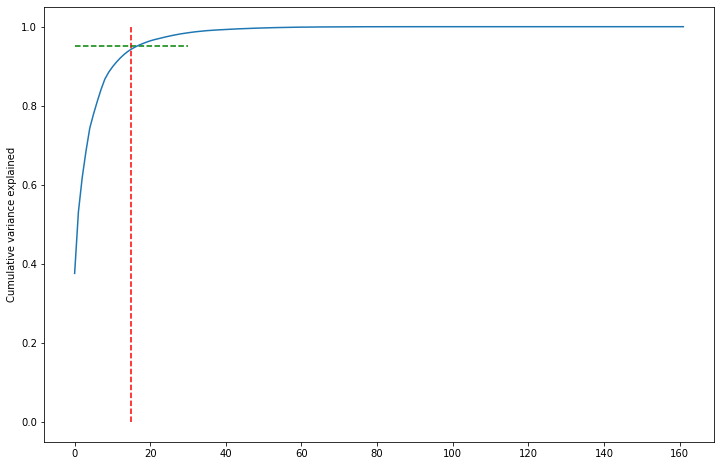

In [646]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=15, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [647]:
import matplotlib.pyplot as plt

<BarContainer object of 162 artists>

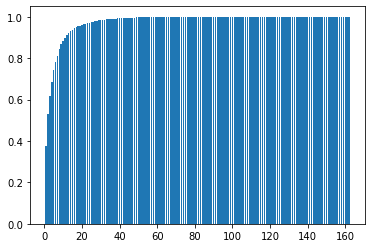

In [648]:
plt.bar(range(1,len(var_cumu)+1), var_cumu)

15 components can actually explain 95% variance

Perform PCA with 15 components

In [649]:
from sklearn.decomposition import IncrementalPCA
pca_final = IncrementalPCA(n_components=15)
df_train_pca = pca_final.fit_transform(X_train)
df_train_pca.shape

(21000, 15)

In [650]:
corrmat = np.corrcoef(df_train_pca.transpose())
corrmat.shape

(15, 15)

Plotting the heatmap of the corr matrix

<AxesSubplot:>

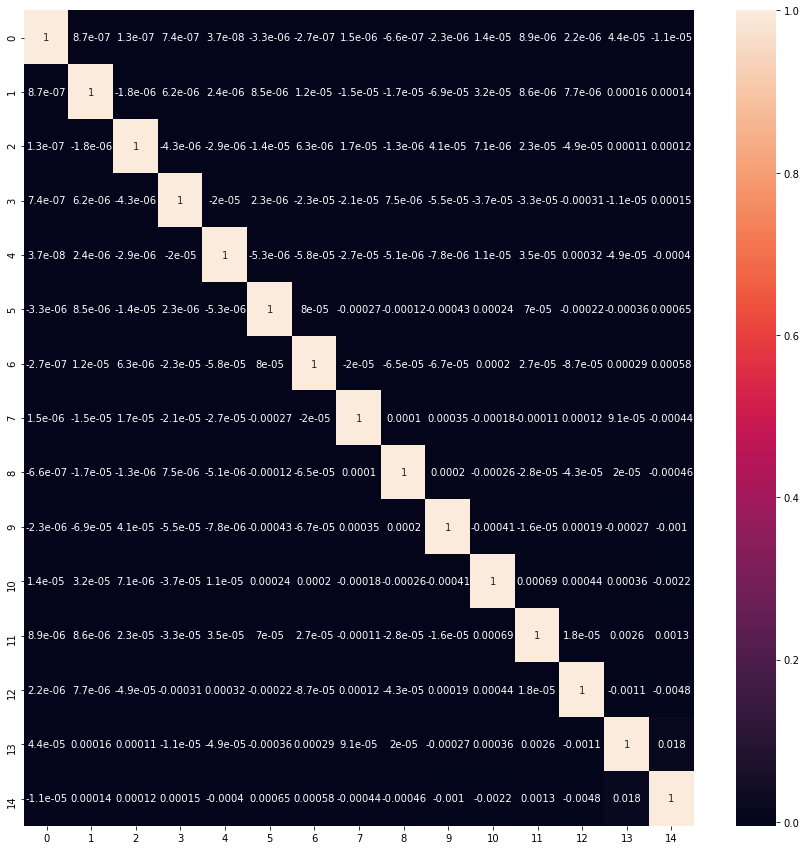

In [651]:
plt.figure(figsize=[15,15])
sns.heatmap(corrmat, annot=True)

Applying the transformation on the test set

In [652]:
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(9001, 15)

### Applying Random Forest on the data on our Principal components

In [653]:
from sklearn.ensemble import RandomForestClassifier

## Handling imbalance class by using class weight

In [654]:
rf = RandomForestClassifier(random_state=42, n_estimators=10, max_depth=3, class_weight="balanced")

In [655]:
rf.fit(df_train_pca, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=3, n_estimators=10,
                       random_state=42)

In [656]:
rf.estimators_[0]

DecisionTreeClassifier(max_depth=3, max_features='auto',
                       random_state=1608637542)

In [657]:
sample_tree = rf.estimators_[4]

In [658]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score

In [659]:
df_pca = pd.DataFrame(data = df_train_pca)

In [660]:
def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=df_pca.columns, 
                    class_names=['Churn', "No Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [661]:
#gph = get_dt_graph(sample_tree)
#Image(gph.create_png(), width=700, height=700)

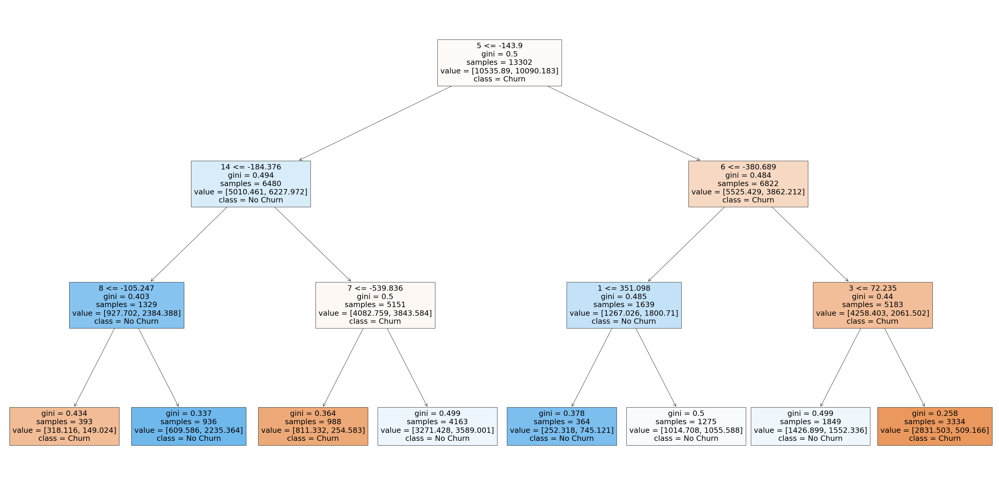

In [662]:
from sklearn.tree import plot_tree
plt.figure(figsize=(60,30))
plot_tree(sample_tree, feature_names = df_pca.columns,class_names=['Churn', 'No Churn'],filled=True);

#### Evaluating model performance

In [663]:
def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_train, dt_classifier.predict(df_train_pca)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, dt_classifier.predict(df_train_pca)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(df_test_pca)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(df_test_pca)))

In [664]:
evaluate_model(rf)

Train Accuracy : 0.7646190476190476
Train Confusion Matrix:
[[14768  4541]
 [  402  1289]]
--------------------------------------------------
Test Accuracy : 0.7604710587712477
Test Confusion Matrix:
[[6296 1955]
 [ 201  549]]


### Variable importance in RandomForest

In [665]:
classifier_rf = RandomForestClassifier(random_state=42, n_jobs=-1, max_depth=5, n_estimators=100, oob_score=True)

In [666]:
classifier_rf.fit(df_train_pca, y_train)

RandomForestClassifier(max_depth=5, n_jobs=-1, oob_score=True, random_state=42)

In [667]:
classifier_rf.feature_importances_

array([0.04531905, 0.04908832, 0.03311305, 0.1693476 , 0.03871718,
       0.02093094, 0.03876115, 0.01602178, 0.32130507, 0.01798981,
       0.09148448, 0.06402059, 0.02261919, 0.01471084, 0.05657095])

In [668]:
imp_df = pd.DataFrame({
    "Varname": df_pca.columns,
    "Imp": classifier_rf.feature_importances_
})

In [669]:
imp_df.sort_values(by="Imp", ascending=False)

,Varname,Imp
8,8,0.321305
3,3,0.169348
10,10,0.091484
11,11,0.064021
14,14,0.056571
1,1,0.049088
0,0,0.045319
6,6,0.038761
4,4,0.038717
2,2,0.033113


In [670]:
df_pca.columns

RangeIndex(start=0, stop=15, step=1)

#### Model 2: RFE + LR

In [671]:
import statsmodels.api as sm

In [672]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20855
Model Family:                Binomial   Df Model:                          144
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 30 May 2021   Deviance:                          nan
Time:                        21:40:36   Pearson chi2:                 1.80e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        8.11e+14    1.9e+06   4.26e+08      0.000    8.11e+14    8.11e+14
arpu_6                      3.075e+11   4022.619   7.64e+07      0.000    3.07e+11    3.07e+11
arpu_7                      1.426e+11   3992.008   3.57e+07      0.000    1.43e+11    1.43e+11
arpu_8                     -2.719e+11   4094.268  -6.64e+07      0.000   -2.72e+11   -2.72e+11
onnet_mou_6                 4.352e+11   8.92e+04   4.88e+06      0.000    4.35e+11    4.35e+11
onnet_mou_7                 9.449e+11    6.9e+04   1.37e+07      0.000    9.45e+11    9.45e+11
onnet_mou_8                -1.064e+12   7.64e+04  -1.39e+07      0.000   -1.06e+12   -1.06e+12
offnet_mou_6                8.859e+11   8.77e+04   1.01e+07      0.000    8.86e+11    8.86e+11
offnet_mou_7               -1.079e+12   6.53e+04  -1.65e+07      0.000   -1.08e+12   -1.08e+12
offnet_mou_8               -1.827e+12   7.43e+04  -2.46e+07      0.000   -1.83e+12   -1.83e+12
roam_ic_mou_6                 4.5e+11   9178.860    4.9e+07      0.000     4.5e+11     4.5e+11
roam_ic_mou_7               1.562e+11   9801.527   1.59e+07      0.000    1.56e+11    1.56e+11
roam_ic_mou_8               -2.25e+11   9432.132  -2.39e+07      0.000   -2.25e+11   -2.25e+11
roam_og_mou_6              -8.653e+11   8.85e+04  -9.78e+06      0.000   -8.65e+11   -8.65e+11
roam_og_mou_7                4.71e+11   6.69e+04   7.04e+06      0.000    4.71e+11    4.71e+11
roam_og_mou_8               1.449e+12   7.55e+04   1.92e+07      0.000    1.45e+12    1.45e+12
loc_og_t2t_mou_6           -1.614e+15   8.24e+07  -1.96e+07      0.000   -1.61e+15   -1.61e+15
loc_og_t2t_mou_7           -3.442e+15   8.24e+07  -4.18e+07      0.000   -3.44e+15   -3.44e+15
loc_og_t2t_mou_8            1.479e+16   8.35e+07   1.77e+08      0.000    1.48e+16    1.48e+16
loc_og_t2m_mou_6           -1.615e+15   8.24e+07  -1.96e+07      0.000   -1.61e+15   -1.61e+15
loc_og_t2m_mou_7            -3.44e+15   8.24e+07  -4.17e+07      0.000   -3.44e+15   -3.44e+15
loc_og_t2m_mou_8            1.479e+16   8.35e+07   1.77e+08      0.000    1.48e+16    1.48e+16
loc_og_t2f_mou_6           -1.616e+15   8.24e+07  -1.96e+07      0.000   -1.62e+15   -1.62e+15
loc_og_t2f_mou_7            -3.44e+15   8.24e+07  -4.17e+07      0.000   -3.44e+15   -3.44e+15
loc_og_t2f_mou_8            1.479e+16   8.35e+07   1.77e+08      0.000    1.48e+16    1.48e+16
loc_og_t2c_mou_6           -8.669e+12   9.22e+04  -9.41e+07      0.000   -8.67e+12   -8.67e+12
loc_og_t2c_mou_7           -7.984e+11   7.34e+04  -1.09e+07      0.000   -7.98e+11   -7.98e+11
loc_og_t2c_mou_8            1.236e+12   8.53e+04   1.45e+07      0.000    1.24e+12    1.24e+12
loc_og_mou_6               -1.486e+15   1.03e+08  -1.44e+07      0.000   -1.49e+15   -1.49e+15
loc_og_mou_7                3.329e+15   1.0

### Feature Selection Using RFE

In [673]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
from sklearn.feature_selection import RFE
rfe = RFE(logreg, 10)             # running RFE with 10 variables as output
rfe = rfe.fit(X,y)
print(rfe.support_)           # Printing the boolean results
print(rfe.ranking_)           # Printing the ranking

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False  True False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False  True
 False  True  True False False False False False False False False False
 False False  True False False False False False  True False False  True
 False False False False False False False False False False False False
 False False False False False False False False False False False  True
 False False False False False False False  True  True False False False
 False False False False False False]
[ 70  87 121 

In [674]:
# Variables selected by RFE 
col = ['spl_og_mou_8', 'ic_others_8', 'total_rech_num_7', 'total_rech_num_8',
       'total_rech_data_8','count_rech_2g_8','count_rech_3g_8', 'sachet_2g_8',
       'fb_user_7','fb_user_8']

In [675]:
# Let's run the model using the selected variables
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
logsk = LogisticRegression(C=1e9)
logsk.fit(X_train, y_train)

LogisticRegression(C=1000000000.0)

In [676]:
#Comparing the model with StatsModels
logm4 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
modres = logm4.fit()
logm4.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                21000
Model:                            GLM   Df Residuals:                    20855
Model Family:                Binomial   Df Model:                          144
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 30 May 2021   Deviance:                          nan
Time:                        21:41:38   Pearson chi2:                 1.80e+19
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        8.11e+14    1.9e+06   4.26e+08      0.000    8.11e+14    8.11e+14
arpu_6                      3.075e+11   4022.619   7.64e+07      0.000    3.07e+11    3.07e+11
arpu_7                      1.426e+11   3992.008   3.57e+07      0.000    1.43e+11    1.43e+11
arpu_8                     -2.719e+11   4094.268  -6.64e+07      0.000   -2.72e+11   -2.72e+11
onnet_mou_6                 4.352e+11   8.92e+04   4.88e+06      0.000    4.35e+11    4.35e+11
onnet_mou_7                 9.449e+11    6.9e+04   1.37e+07      0.000    9.45e+11    9.45e+11
onnet_mou_8                -1.064e+12   7.64e+04  -1.39e+07      0.000   -1.06e+12   -1.06e+12
offnet_mou_6                8.859e+11   8.77e+04   1.01e+07      0.000    8.86e+11    8.86e+11
offnet_mou_7               -1.079e+12   6.53e+04  -1.65e+07      0.000   -1.08e+12   -1.08e+12
offnet_mou_8               -1.827e+12   7.43e+04  -2.46e+07      0.000   -1.83e+12   -1.83e+12
roam_ic_mou_6                 4.5e+11   9178.860    4.9e+07      0.000     4.5e+11     4.5e+11
roam_ic_mou_7               1.562e+11   9801.527   1.59e+07      0.000    1.56e+11    1.56e+11
roam_ic_mou_8               -2.25e+11   9432.132  -2.39e+07      0.000   -2.25e+11   -2.25e+11
roam_og_mou_6              -8.653e+11   8.85e+04  -9.78e+06      0.000   -8.65e+11   -8.65e+11
roam_og_mou_7                4.71e+11   6.69e+04   7.04e+06      0.000    4.71e+11    4.71e+11
roam_og_mou_8               1.449e+12   7.55e+04   1.92e+07      0.000    1.45e+12    1.45e+12
loc_og_t2t_mou_6           -1.614e+15   8.24e+07  -1.96e+07      0.000   -1.61e+15   -1.61e+15
loc_og_t2t_mou_7           -3.442e+15   8.24e+07  -4.18e+07      0.000   -3.44e+15   -3.44e+15
loc_og_t2t_mou_8            1.479e+16   8.35e+07   1.77e+08      0.000    1.48e+16    1.48e+16
loc_og_t2m_mou_6           -1.615e+15   8.24e+07  -1.96e+07      0.000   -1.61e+15   -1.61e+15
loc_og_t2m_mou_7            -3.44e+15   8.24e+07  -4.17e+07      0.000   -3.44e+15   -3.44e+15
loc_og_t2m_mou_8            1.479e+16   8.35e+07   1.77e+08      0.000    1.48e+16    1.48e+16
loc_og_t2f_mou_6           -1.616e+15   8.24e+07  -1.96e+07      0.000   -1.62e+15   -1.62e+15
loc_og_t2f_mou_7            -3.44e+15   8.24e+07  -4.17e+07      0.000   -3.44e+15   -3.44e+15
loc_og_t2f_mou_8            1.479e+16   8.35e+07   1.77e+08      0.000    1.48e+16    1.48e+16
loc_og_t2c_mou_6           -8.669e+12   9.22e+04  -9.41e+07      0.000   -8.67e+12   -8.67e+12
loc_og_t2c_mou_7           -7.984e+11   7.34e+04  -1.09e+07      0.000   -7.98e+11   -7.98e+11
loc_og_t2c_mou_8            1.236e+12   8.53e+04   1.45e+07      0.000    1.24e+12    1.24e+12
loc_og_mou_6               -1.486e+15   1.03e+08  -1.44e+07      0.000   -1.49e+15   -1.49e+15
loc_og_mou_7                3.329e+15   1.0

In [677]:
X_test[col].shape

(9001, 10)

In [678]:
### Making Predictions

In [679]:
# Predicted probabilities
y_pred = logsk.predict_proba(X_test)
# Converting y_pred to a dataframe which is an array
y_pred_df = pd.DataFrame(y_pred)
# Converting to column dataframe
y_pred_1 = y_pred_df.iloc[:,[1]]
# Let's see the head
y_pred_1.head()

,1
0,0.261008
1,0.170246
2,0.002119
3,0.059109
4,0.361190


In [680]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)
y_test_df.head()

,churn
20296,1
8279,1
72269,0
65602,0
42758,1


In [681]:
y_test_df.churn.unique()

array([1, 0])

In [682]:
# Putting CustID to index
y_test_df['CustID'] = y_test_df.index
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df,y_pred_1],axis=1)
y_pred_final.head()

,churn,CustID,1
0,1,20296,0.261008
1,1,8279,0.170246
2,0,72269,0.002119
3,0,65602,0.059109
4,1,42758,0.361190


In [683]:

# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 1 : 'Churn_Prob'})

# Let's see the head of y_pred_final
y_pred_final.head()

,churn,CustID,Churn_Prob
0,1,20296,0.261008
1,1,8279,0.170246
2,0,72269,0.002119
3,0,65602,0.059109
4,1,42758,0.361190


In [684]:
# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_pred_final['predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
# Let's see the head
y_pred_final.head()

,churn,CustID,Churn_Prob,predicted
0,1,20296,0.261008,0
1,1,8279,0.170246,0
2,0,72269,0.002119,0
3,0,65602,0.059109,0
4,1,42758,0.361190,0


### Model Evaluation

In [685]:
from sklearn import metrics

In [686]:
# Confusion matrix 
confusion = metrics.confusion_matrix( y_pred_final.churn, y_pred_final['predicted'] )
confusion

array([[8133,  118],
       [ 489,  261]])

In [687]:
# Predicted     Churn  not_churn  __all__
# Actual
# Churn            8133   118     8251
# not_churn         489   261      750
# __all__          8622   379     9001

In [688]:
#Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.churn, y_pred_final.predicted)

0.9325630485501611

In [689]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

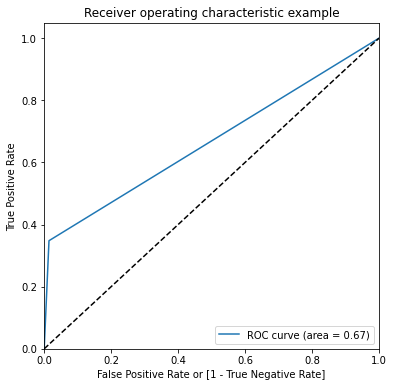

(array([0.       , 0.0143013, 1.       ]),
 array([0.   , 0.348, 1.   ]),
 array([2, 1, 0]))

In [690]:
draw_roc(y_pred_final.churn, y_pred_final.predicted)

In [691]:
#draw_roc(y_pred_final.Churn, y_pred_final.predicted)
"{:2.2f}".format(metrics.roc_auc_score(y_pred_final.churn, y_pred_final.Churn_Prob))

'0.88'

#### We see an overall AUC score of 0.88 looks like we did a decent job.